# SMAI Assignment - 2

## Question - `2` : Face Recognition using Principal Component Analysis

| | |
|- | -|
| Course | Statistical Methods in AI |
| Release Date | `16.02.2023` |
| Due Date | `24.02.2023` |

### <b>Objective:</b>
This question requires you to create a basic facial recognition system using a technique called principal component analysis (PCA) 
by projecting the face images on the feature space (face space) which best
represents the variations among distinct faces. The face space is defined as the
“Eigenfaces", which are the eigenvectors of the set of faces.

The goal of implementing this system is to recognize a person's face by comparing it to a pre-existing database of faces, and identifying the closest match.

Link to paper on Eigenfaces: [https://sites.cs.ucsb.edu/~mturk/Papers/mturk-CVPR91.pdf](https://sites.cs.ucsb.edu/~mturk/Papers/mturk-CVPR91.pdf)

### <b>About the dataset:</b>  
The AT&T face dataset contains a set of grayscale face images with dimensions 92x112. The images are organised in 40 directories (one for each subject), which have names of the form sX, where X indicates the subject number (between 1 and 40). In each of these directories, there are ten different images of that subject, which have names of the form Y.pgm, where Y is the image number for that subject (between 1 and 10). These 10 images per person are taken at different times, varying the lighting, facial expressions (open / closed eyes, smiling / not smiling) and facial details (glasses / no glasses). All the images were taken against a dark homogeneous background with the subjects in an upright, frontal position (with tolerance for some side movement). <b>Link:</b> [https://git-disl.github.io/GTDLBench/datasets/att_face_dataset/](https://git-disl.github.io/GTDLBench/datasets/att_face_dataset/)



### Tasks
1. Load dataset and divide the date into training and test sets. 
2. Implement the PCA algorithm from scratch.
3. Implement image reconstruction using the eigen projections and visualise differences for different number of components.
4. Visualise the mean(Eigen face) generated.
5. Given training set, obtain accuracy by attempting a face regonition module and obtaining the accuracy for different number of principal components.


#### Import Libraries

In [42]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error


#### Import Dataset
Assign labels for the images based on the subdirectories to obtain X(images array) and y (labels).

Ensure that the test data contains atleast one image from each category.

Test image each person have 2 image


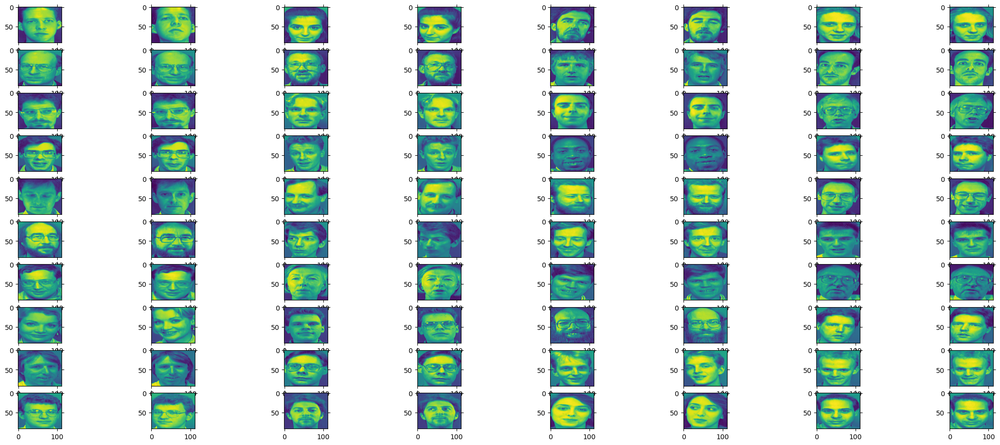

In [43]:
dir = "ATnT"

xtest_image_data=[]
xtrain_image_data=[]
ytest_image_data=[]
ytrain_image_data=[]
no_of_elm_train=[]
no_of_elm_test=[]
target_name_array=[]
target_name_set={}
image_name_train=[]
image_name_test=[]
t_o=0
for f_name in os.listdir(dir):
    path_f = os.path.join(dir, f_name)
    if os.path.isdir(path_f):
        if len(os.listdir(path_f))>= 8:
            i = 0
            for img_name in os.listdir(path_f):
                img_path = os.path.join(path_f, img_name)
                if(i<8):
                    image_name_train+=[img_path]
                    ytrain_image_data+=[t_o]
                    if(len(no_of_elm_train)>t_o):
                        no_of_elm_train[t_o]+=1
                    else:
                        no_of_elm_train+=[1]
                    if(i==0):
                        target_name_array+=[img_name]
                        target_name_set[t_o]=img_name
                else:
                    image_name_test+=[img_path]
                    ytest_image_data+=[t_o]
                    if(len(no_of_elm_test)>t_o):
                        no_of_elm_test[t_o]+=1
                    else:
                        no_of_elm_test+=[1]
                i=i+1
            t_o=t_o+1
n1=len(image_name_train)
image_name_test
height=112
width=92
size=(height*width)
train_mat=np.zeros((n1,size))
i = 0
for name1 in image_name_train:
    gray = cv2.imread(name1, 0)
    gray = cv2.resize(gray, (height,width))
    mat = np.asmatrix(gray)
    train_mat[i,:] = mat.ravel()
    
    i=i+1
k=0
n2=len(image_name_test)
test_mat=np.zeros((n2,size))
for name2 in image_name_test:
    gray1 = cv2.imread(name2, 0)
    gray1 = cv2.resize(gray1, (height,width))
    mat1 = np.asmatrix(gray1)
    test_mat[k,:] = mat1.ravel()
    
    k=k+1

# eig_vecs = train_mat[0,:].reshape(92, 112)
# plt.imshow(eig_vecs)
# plt.show()
# eig_vecs1 = test_mat[0,:].reshape(92, 112)
# plt.imshow(eig_vecs1)
# plt.show()
for ii in range(len(test_mat)):
    eig_vecs1 = test_mat[ii,:].reshape(92, 112)
    plt.subplot(10,8,ii+1)
    plt.imshow(eig_vecs1)
    plt.subplots_adjust(right=1.2, top=1.2)
    plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
print("Test image each person have 2 image")
plt.show()




        

#### Implement PCA Algorithm.

Explain your steps with comments and write a brief explanation of the method.

In [44]:
"""
Implement pca in the following function by taking the following arguements:
1. X(images array)
2. number of components
The function must return the eigen vectors (principal components) also termed "Eigen faces"
"""
"""
steps
1) first we have to normalize our  data in this i subtract the mean of perticular column
2)then i  found the covarians matrix
3)After i calculate the eignevalue and eignr vector
4)and finaly i sort the eignevector in desending order with the help of eignevalue and then return the top n eigne vector


"""
def principalComponentAnalysis(train_mat,num):
    global cov_mat
    global all_eigne_value
    global col_mean
    global all_eigne_vect2
    col_mean=np.mean(train_mat, axis = 0)

    X_temp=train_mat - col_mean

    cov_mat = np.cov(X_temp.T)

    all_eigne_value, all_eigne_vect = np.linalg.eigh(cov_mat)
    sorted_indices = np.argsort(all_eigne_value)[::-1]

    all_eigne_vect2 = all_eigne_vect[:,sorted_indices]

    return all_eigne_vect2[:,:num]
pca_res_vec=principalComponentAnalysis(train_mat,20)

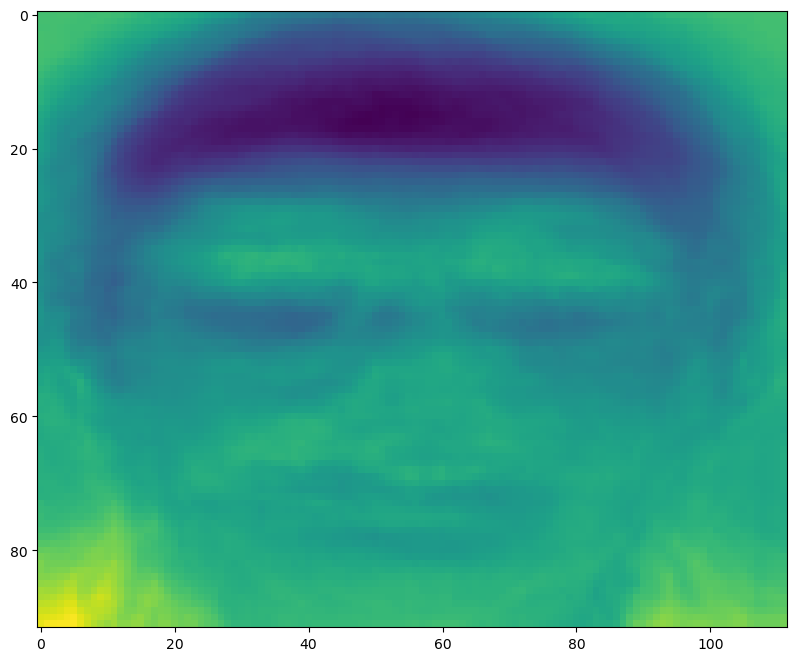

In [45]:
# pca_res_vec=np.flip(pca_res_vec)
eig_vecs = pca_res_vec[:,0].reshape(92, 112)
plt.imshow(eig_vecs)
plt.show()


#### Implement Image Reconstruction from Eigenfaces


Explain your steps with comments and write a brief explanation of the method.

In [46]:
# Function to implement image reconstruction by taking arguements as necessary.
"""
imageReconstruction take 3 value as argument(image,eigenvectormatrix,mean)
with the help of i normalize our image vector after normalize take a dot product of normalized image matrix and eigne vector matrix
then take dot product of matrix given in above step with eignevector transpose matrix and then return the matrix
"""
def imageReconstruction(img,vect,men):
    temp1=np.dot(img - men, vect)
    temp2=np.dot(temp1, vect.T)
    temp3=temp2+men
    return temp3

#### Visualisation
Visualise the results for different number of principal components(pc = 5,10,100, 1000, all).

**Note:** Ensure that the images are labelled appropriately.

component=5  component=10  component=100  component=1000  component=10304
person label 0


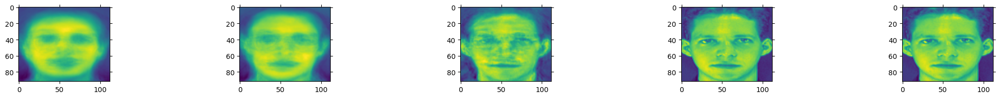

person label 1


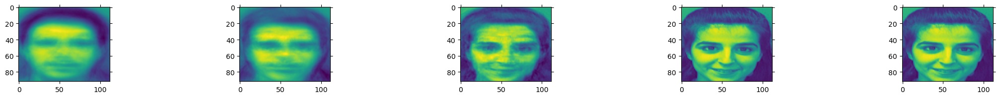

person label 2


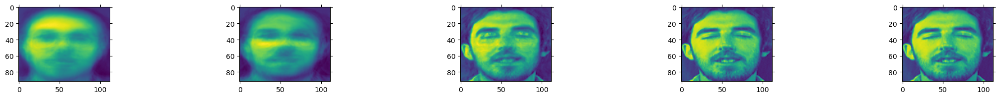

person label 3


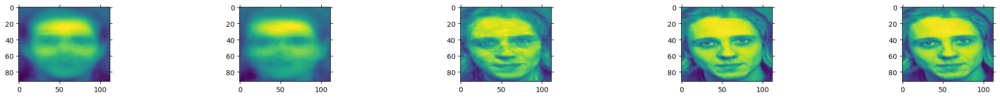

person label 5


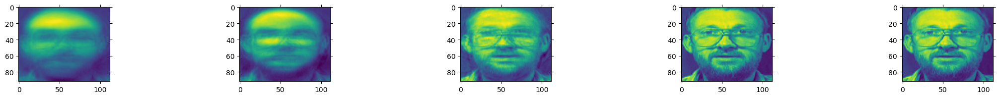

person label 6


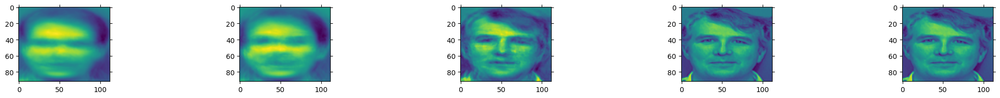

person label 7


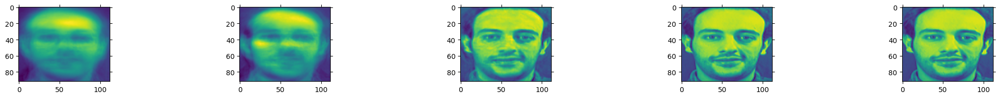

person label 8


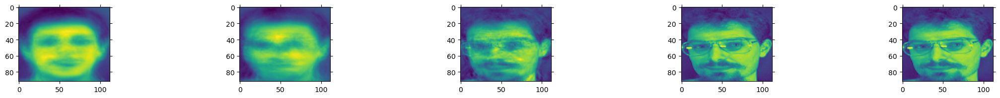

person label 10


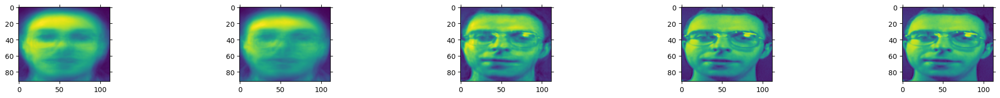

person label 11


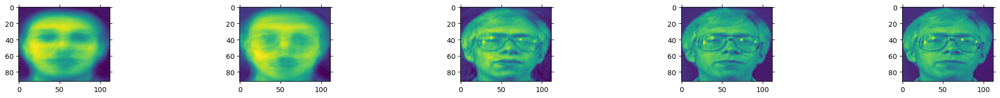

In [47]:
print("component=5  component=10  component=100  component=1000  component=10304")
for ji in range(0,100,10):
    po=0
    for i in [5,10,100,1000,10304]:
        vect=all_eigne_vect2[:,:i]
        resultimg=imageReconstruction(train_mat[ji,:].reshape(1,10304),vect,col_mean.reshape(1,10304))
        generatedimg = resultimg.reshape(92, 112)
        plt.subplot(5,5,po+1)
#         plt.imshow(generatedimg,cmap='gray')
        plt.imshow(generatedimg)
        plt.subplots_adjust(right=1.2, top=1.2)
        plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
        po=po+1
    print("person label "+str(ytrain_image_data[ji])+"")
    plt.show()
    
        
#         plt.text(0.5, -0.1, ''+str(ytest_image_data[ji])+'', size=12, ha="center", transform=plt.gca().transAxes)
#         po=po+1
  
    
    

#### Implement face recognition module based on the norm
Explain your steps with comments and write a brief explanation of the method.

*   Test the module and report accuracies based on the number of components taken for a range of value and plot them. 
*   Also plot the mean square error vs the number of eigenvectors taken and report your observations. 
*   For further empirical analysis, plot the semi-log variant of the error plot obtained above.

In [48]:
"""
Implement pca in the following function by taking the following arguements:
1. Test image
2. Eigenvectors
3. Mean Eigen Face
4. Training Set(X_train,y_train)
The function must return the following:
1. image with smallest error
2. error value
3. prediction class
"""
def model(test_img,train_after_dot_with_eigne,test_after_dot_with_eigne,ytrain_image_data,c):
    distances = np.sqrt(np.sum((train_after_dot_with_eigne - test_img)**2, axis=1))
    nearesr_img = np.argmin(distances)
    error=distances[nearesr_img]
    
    return nearesr_img,error,ytrain_image_data[nearesr_img]

Accuracy at component5 :  0.8375
Accuracy at component10 :  0.95
Accuracy at component100 :  0.975
Accuracy at component1000 :  0.975
Accuracy at component10304 :  0.975
  Test Image   predict_Image(5)   predict_Image(10)   predict_Image(100)   predict_Image(1000)   predict_Image(10304)


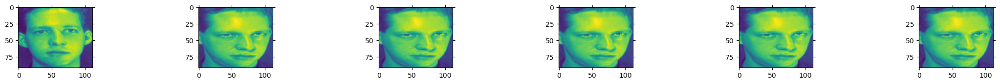

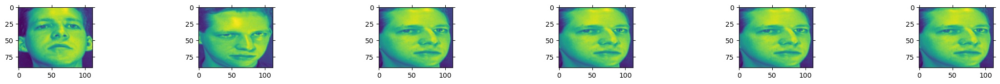

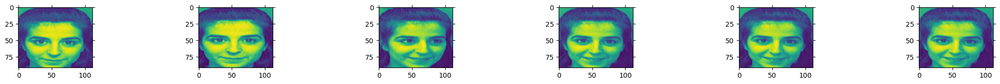

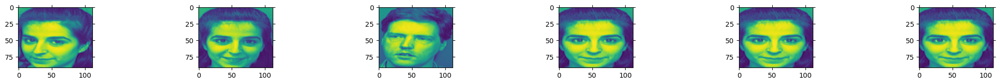

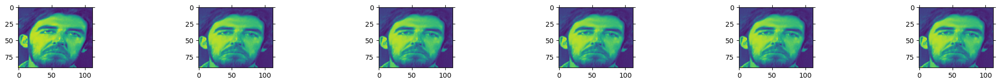

...

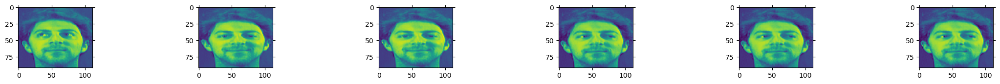

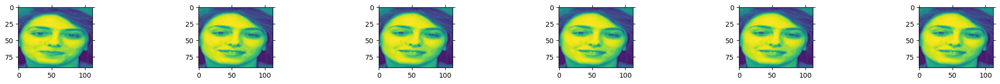

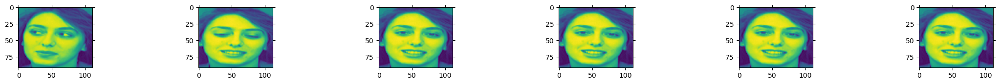

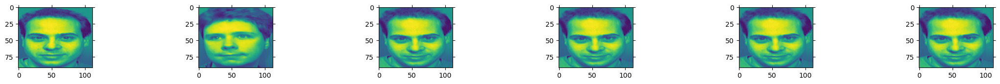

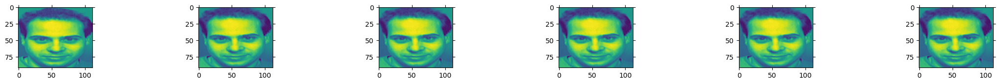

In [49]:
"""
Iterate through all the images in the test data and 
test the accurate by taking different number of components
"""
from sklearn.metrics import accuracy_score
empty_array = np.empty((80, 5))
op=0
accr_arr=[]
mse_arr=[]
for comp in [5,10,100,1000,10304]:
    temp_all_vect=all_eigne_vect2[:,:comp]

    train_after_dot_with_eigne=np.dot(train_mat,temp_all_vect)
    test_after_dot_with_eigne=np.dot(test_mat,temp_all_vect)
    io=0
    y_pred=[]
    err_t=[]
    for test_img in test_after_dot_with_eigne:
        img_pred,err,pred=model(test_img,train_after_dot_with_eigne,test_after_dot_with_eigne,ytrain_image_data,comp)
        empty_array[io][op]=img_pred
        y_pred.append(pred)
        io=io+1
        err_t.append(err)
    accr=accuracy_score(ytest_image_data, y_pred)
    
    accr_arr.append(accr)
    mse=np.sum(err_t)/comp
    mse_arr.append(mse)
    print("Accuracy at component"+str(comp)+" : ", accr)
    op=op+1
empty_array[0][0]
# generatedimg = test_mat[0,:].reshape(92, 112)
# plt.imshow(generatedimg)
# plt.show()
print("  Test Image   predict_Image(5)   predict_Image(10)   predict_Image(100)   predict_Image(1000)   predict_Image(10304)")
for hi in range(len(ytest_image_data)):
    qo=0
    generatedimg = test_mat[hi,:].reshape(92, 112)
    plt.subplot(6,6,qo+1)
    plt.imshow(generatedimg)
    plt.subplots_adjust(right=1.2, top=1.2)
    plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
    qo=qo+1
    for bi in range(5):
#         print(int(empty_array[hi][bi]))
        generatedimg = train_mat[int(empty_array[hi][bi]),:].reshape(92, 112)
        plt.subplot(6,6,qo+1)
        plt.imshow(generatedimg)
        plt.subplots_adjust(right=1.2, top=1.2)
        plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
        qo=qo+1
    
    plt.show()
        

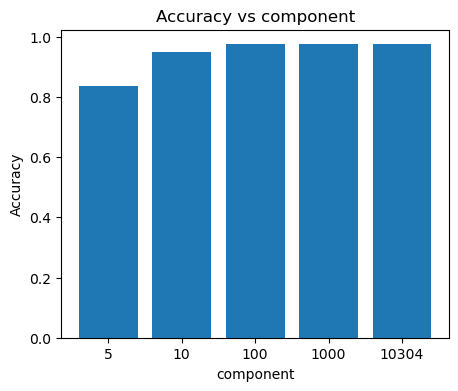

In [50]:
#plot accuracy vs component
fig = plt.figure(figsize =(5,4))
plt.bar(["5","10","100","1000","10304"],accr_arr)

plt.xlabel('component')
plt.ylabel('Accuracy')
plt.title('Accuracy vs component')
plt.show()

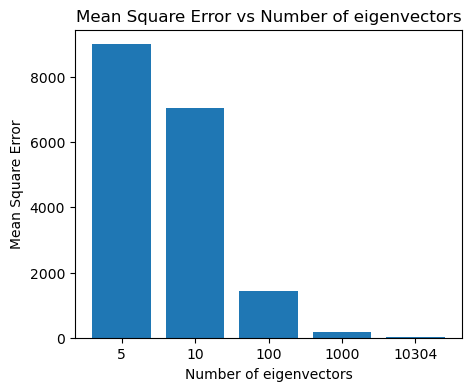

[8998.600163049605,
 7049.117312057392,
 1436.651403879916,
 176.83153154832416,
 20.214462406605644]

In [51]:
# Plot Number of eigenvectors vs Mean Square Error
fig = plt.figure(figsize =(5,4))
plt.bar(["5","10","100","1000","10304"],mse_arr)

plt.xlabel('Number of eigenvectors')
plt.ylabel('Mean Square Error')
plt.title('Mean Square Error vs Number of eigenvectors')
plt.show()
mse_arr

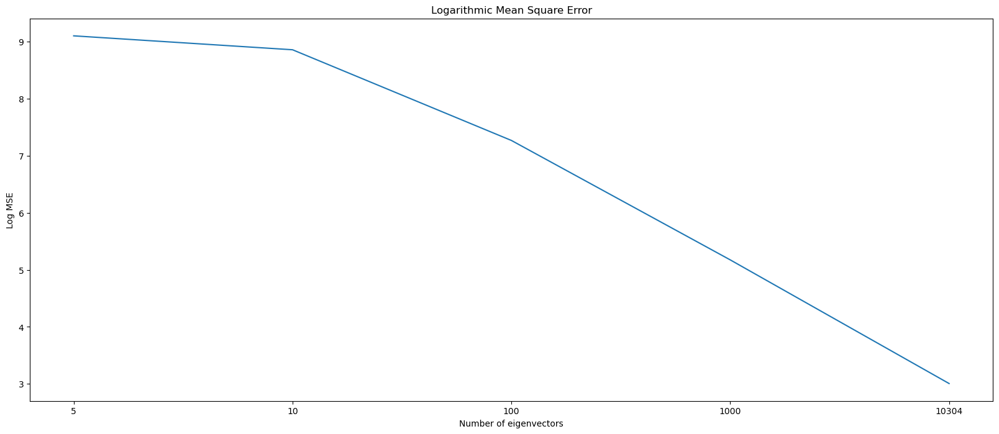

In [52]:
# Plot Number of eigenvectors vs Logarithmic Mean Square Error
log_mse_values = np.log(mse_arr)


plt.plot(["5","10","100","1000","10304"],log_mse_values)
plt.xlabel('Number of eigenvectors')
plt.ylabel('Log MSE')
plt.title('Logarithmic Mean Square Error')
plt.show()

Summarise your observations on the plots and accuracies

**Answer:**
when we take only 5 eignevector in sorted order the accuracy is least and accuracy is increase when we increase size of eignevector

State the advantages and limitations of using PCA in general. Also state its limitations in context of face recognition

**Answer:**

### Advantages of PCA in general

1) with the help of PCA we can reduces the number of variables(features) in a dataset without loosing the any variability present in the original data. PCA simplifies the analysis of large datasets.

2) Data visualization: PCA can be used to visualize high-dimensional data in a lower-dimensional space, making it easier to understand the structure of the data and identify patterns and relationships.



### Limitations of PCA in general

1) Before applying principal component analysis, you must normalize your data; otherwise, PCA will be difficult to discover optimal principal components. The scale has an effect on PCA, thus you must scale the features in your data before using PCA. As a result, principal components will be skewed toward characteristics with large variance, resulting in incorrect findings. 

2) Interpretation: Those principal components generated by PCA are linear combinations of the original variables and may be difficult to interpret in terms of the original data.

### Limitations of PCA in context face recognition:

Sensitive to variations in illumination: PCA is sensitive to variations in illumination, which can make it difficult to recognize faces under different lighting conditions. This can be partially addressed by preprocessing the images to remove illumination effects.